# 岡山県高梁市と同市巨瀬町における土地利用の変化から見る水田の消失

## 1. 分析

### 1.1. ライブラリimport

In [108]:
import pandas as pd
import geopandas as gpd
import numpy as np
import rasterio as rio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import folium

### 1.2. 1976年から2021年までの巨瀬町における土地利用の可視化

QGISでも同様の可視化を行ったが、本Notebookでも1976年から2021年までの土地利用の変化をFoliumを用いて可視化する。
Foliumを選定した理由としてはhtmlに出力することでQGISのインストールを問わずインタラクティブなデータの表示切替が可能だからである。

<figure>
  <img src="/home/jovyan/work/data/Output/FromQGIS/1976vs2021.png" width="50%">
  <figcaption>QGISで作成した比較地図</figcaption>
</figure>

#### 1.2.1. ファイル読み込み

データの中身を確認するprint文は本Notebookの可読性向上のためにコメントアウトしている。

使用した岡山県エリアの土地利用データは以下のサイトからダウンロードしている。

- [国土数値情報ダウンロードサイト](https://nlftp.mlit.go.jp/ksj/gml/datalist/KsjTmplt-L03-b-2021.html)より取得
    - 1976年・1987年・1991年・1997年・2006年・2009年・2014年・2016年・2021年の岡山県の土地利用マップ
- [岡山県高梁市の境界データ(2022年)](https://www.e-stat.go.jp/gis/statmap-search?page=1&type=2&aggregateUnitForBoundary=A&toukeiCode=00200521&toukeiYear=2020&serveyId=A002005212020&prefCode=33&coordsys=1&format=shape&datum=2000)
- [河川データ(平成20年度岡山県世界測地系)](https://nlftp.mlit.go.jp/ksj/gml/datalist/KsjTmplt-W05.html)

**また、座標系はデフォルトでWGS84(EPSG:4326)を使用する。**

In [ ]:
#Read Files
#Change the file path for each environment
landuse_file_1976 = r"xxxx.shp"
landuse_file_1987 = r"xxxx.shp"
landuse_file_1991 = r"xxxx.shp"
landuse_file_1997 = r"xxxx.shp"
landuse_file_2006 = r"xxxx.shp"
landuse_file_2009 = r"xxxx.shp"
landuse_file_2014 = r"xxxx.shp"
landuse_file_2016 = r"xxxx.shp"
landuse_file_2021 = r"xxxx.shp"

city_boundary = r'xxxx.shp'

town_boundary = r'xxxx.shp'

river_file = r"xxxx.shp"

#岡山県高梁市のデータを取得
#Get data for Takahashi City, Okayama Prefecture
gdf_city = gpd.read_file(city_boundary, encoding='shift-jis')
#print(gdf_city['N03_004'].unique)
gdf_takahashi = gdf_city[gdf_city["N03_004"].str.contains('高梁')][['geometry']]
gdf_takahashi = gdf_takahashi.to_crs(epsg=4326) #4326系に設定

#Loading the boundary data of Okayama pref/Takahashi city
#岡山県高梁市の町村区境界データの読み込み
gdf_town = gpd.read_file(town_boundary)
gdf_town = gdf_town.to_crs(epsg=4326) #4326系に設定
#"S_NAME"に"巨瀬町"を含むものを新規にgdfとして抽出
#Extract lines which has '巨瀬町(Kose Town)' in column 'S_NAME'
gdf_kose = gdf_town[gdf_town["S_NAME"].str.contains('巨瀬町')][['S_NAME','geometry']]

# Check Datas
#座標系が定義されていないものに対して座標系を設定
#Set CRS on the data frame if it does not have CRS
#(xmlファイルを目視確認して、適切な座標系を設定)
#(Set appopriate CRS with checking XML file)
#to_crsで最終的にすべて4326系に統一
#Set CRS 4326 on the all datas

gdf_1976 = gpd.read_file(landuse_file_1976)[['L03b_002','geometry']]
gdf_1976.set_crs(epsg=4301,inplace=True,allow_override=True) #Tokyo Datumに設定
gdf_1976 = gdf_1976.to_crs(epsg=4326) #4326系に設定
#print("1976年")
#print(gdf_1976.head())
#print(gdf_1976['L03b_002'].unique())
#print(gdf_1976.info())
#print()

gdf_1987 = gpd.read_file(landuse_file_1987)[['L03b_002','geometry']]
gdf_1987.set_crs(epsg=4301,inplace=True,allow_override=True) #Tokyo Datumに設定
gdf_1987 = gdf_1987.to_crs(epsg=4326) #4326系に設定
#print("1987年")
#print(gdf_1987.head())
#print(gdf_1987['L03b_002'].unique())
#print(gdf_1987.info())
#print()

gdf_1991 = gpd.read_file(landuse_file_1991)[['L03b_002','geometry']]
gdf_1991.set_crs(epsg=4301,inplace=True,allow_override=True) #Tokyo Datumに設定
gdf_1991 = gdf_1991.to_crs(epsg=4326) #4326系に設定
#print("1991年")
#print(gdf_1991.head())
#print(gdf_1991['L03b_002'].unique())
#print(gdf_1991.info())
#print()

gdf_1997 = gpd.read_file(landuse_file_1997)[['L03b_002','geometry']]
gdf_1997.set_crs(epsg=4301,inplace=True,allow_override=True) #Tokyo Datumに設定
gdf_1997 = gdf_1997.to_crs(epsg=4326) #4326系に設定
#print("1997年")
#print(gdf_1997.head())
#print(gdf_1997['L03b_002'].unique())
#print(gdf_1997.info())
#print()

gdf_2006 = gpd.read_file(landuse_file_2006)[['L03b_002','geometry']]
gdf_2006.set_crs(epsg=4301,inplace=True,allow_override=True) #Tokyo Datumに設定
gdf_2006 = gdf_2006.to_crs(epsg=4326) #4326系に設定
#print("2006年")
#print(gdf_2006.head())
#print(gdf_2006['L03b_002'].unique())
#print(gdf_2006.info())
#print()

gdf_2009 = gpd.read_file(landuse_file_2009,encoding="utf-8")[['土地利用種','geometry']]
gdf_2009 = gdf_2009.to_crs(epsg=4326) #4326系に設定
#print("2009年")
#print(gdf_2009.head())
#print(gdf_2009['土地利用種'].unique())
#print(gdf_2009.info())
#print()

gdf_2014 = gpd.read_file(landuse_file_2014,encoding="shift-jis")[['土地利用種','geometry']]
gdf_2014 = gdf_2014.to_crs(epsg=4326) #4326系に設定
#print("2014年")
#print(gdf_2014.head())
#print(gdf_2014['土地利用種'].unique())
#print(gdf_2014.info())
#print()

gdf_2016 = gpd.read_file(landuse_file_2016,encoding="shift-jis")[['土地利用種','geometry']]
gdf_2016 = gdf_2016.to_crs(epsg=4326) #4326系に設定
#print("2016年")
#print(gdf_2016.head())
#print(gdf_2016['土地利用種'].unique())
#print(gdf_2016.info())
#print()

gdf_2021 = gpd.read_file(landuse_file_2021,encoding="shift-jis")[['L03b_002','geometry']]
gdf_2021 = gdf_2021.to_crs(epsg=4326) #4326系に設定
#print("2021年")
#print(gdf_2021.head())
#print(gdf_2021['L03b_003'].unique())
#print(gdf_2021.info())
#print()

gdf_river = gpd.read_file(river_file,encoding="utf-8")[['geometry']]
gdf_river.set_crs(epsg=4612,inplace=True,allow_override=True) #JGD2000に設定 #Set CRS to JGD2000
gdf_river = gdf_river.to_crs(epsg=4326) #4326に設定 #Set CRS to 4326
#print("河川")
#print(gdf_river.head())
#print(gdf_river.info())
#print()

#### 1.2.2. 土地利用分類の再定義

1.2.1 で確認したように、各年代間で土地利用分類のラベル番号が異なり、分類の粒度も異なっていることが分かる。\
このままでは、年代間で土地利用マップの可視化を行った際に土地利用の遷移が分かりづらいため、\
本分析の目的に沿って1976年から2021年までの分類を再定義する。\
再定義の対応は以下の表の通り。

| 割り当て番号 | 旧土地利用種別 | 新割り当て番号 | 新土地利用種別 | 色 |
| ------------  |-------------- | ---------- | -----------  | --- |   
| 1             | 田           |     100    | 田           | 黄色 |
| 2             | 畑           |     200    | 畑           | オレンジ |
| 3             | 果樹園       |     200    | 畑            | オレンジ |
| 4             | その他果樹園  |    200     | 畑            | オレンジ |
| 5             | 森林       　|    500     | 森林           | 緑 |
| 6             | 荒地         |    600     | 荒地          | 黄緑 |
| 7             | 建物用地A     |    700    | 開発地        | 赤 |
| 8             | 建物用地B     | 700       | 開発地        | 赤 |
| 9             | 幹線交通用地  | 700       |  開発地        | 赤 |
| A             | その他用地    | 700       | 開発地        | 赤 |
| B             | 湖沼       　 | 1100       | 河川及び湖沼  | 青 |
| C             | 河川地A       | 1100       | 河川及び湖沼   | 青 |
| D             | 河川地B       | 1100       | 河川及び湖沼   | 青 |
| 0100             | 田           |     100    | 田           | 黄色 |
| 0200             | 畑           |     200    | 畑           | オレンジ |
| 0500             | 森林       　|    500     | 森林           | 緑 |
| 0600             | 荒地         |    600     | 荒地          | 黄緑 |
| 0700             | 建物用地     |    700    | 開発地        | 赤 |
| 0901             | 道路          | 700       |  開発地        | 赤 |
| 0902             | 鉄道          | 700       |  開発地        | 赤 |
| 1000             | その他用地     | 700       |  開発地        | 赤 |
| 1100             | 湖沼       　 | 1100       | 河川及び湖沼  | 青 |
| 1600             | ゴルフ場       | 600       | 荒地  | 黄緑 |





In [110]:
#Remove blank if each landuse-code has it
#念のための空白削除
gdf_1976['L03b_002'] = gdf_1976['L03b_002'].astype(str).str.strip()
#print(gdf_1976.info())
gdf_1987['L03b_002'] = gdf_1987['L03b_002'].astype(str).str.strip()
#print(gdf_1987.info())
gdf_1991['L03b_002'] = gdf_1991['L03b_002'].astype(str).str.strip()
#print(gdf_1991.info())
gdf_1997['L03b_002'] = gdf_1997['L03b_002'].astype(str).str.strip()
#print(gdf_1997.info())
gdf_2006['L03b_002'] = gdf_2006['L03b_002'].astype(str).str.strip()
#print(gdf_2006.info())
gdf_2009['土地利用種'] = gdf_2009['土地利用種'].astype(str).str.strip()
#print(gdf_2009.info())
gdf_2014['土地利用種'] = gdf_2014['土地利用種'].astype(str).str.strip()
#print(gdf_2014.info())
gdf_2016['土地利用種'] = gdf_2016['土地利用種'].astype(str).str.strip()
#print(gdf_2016.info())
gdf_2021['L03b_002'] = gdf_2021['L03b_002'].astype(str).str.strip()
#print(gdf_2021.info())


In [111]:
#Create New Land Use Dictionary
#新規土地利用コードの辞書を作成

landuse_type_convert = {
    '1' : 100,
    '2' : 200,
    '3' : 200,
    '4' : 200,
    '5' : 500,
    '6' : 600,
    '7' : 700,
    '8' : 700,
    '9' : 700,
    'A' : 700,
    'B' : 1100,
    'C' : 1100,
    'D' : 1100,
    '0100' : 100,
    '0200' : 200,
    '0500' : 500,
    '0600' : 600,
    '0700' : 700,
    '0901' : 700,
    '0902' : 700,
    '1000' : 700,
    '1100' : 1100,
    '1600' : 600
}

#Convert old code to new code
#新規土地利用コードを適用
gdf_1976['new_landuse_code'] = gdf_1976['L03b_002'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_1976.head())
gdf_1987['new_landuse_code'] = gdf_1987['L03b_002'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_1987.head())
gdf_1991['new_landuse_code'] = gdf_1991['L03b_002'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_1991.head())
gdf_1997['new_landuse_code'] = gdf_1997['L03b_002'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_1997.head())
gdf_2006['new_landuse_code'] = gdf_2006['L03b_002'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_2006.head())
gdf_2009['new_landuse_code'] = gdf_2009['土地利用種'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_2009.head())
gdf_2014['new_landuse_code'] = gdf_2014['土地利用種'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_2014.head())
gdf_2016['new_landuse_code'] = gdf_2016['土地利用種'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_2016.head())
gdf_2021['new_landuse_code'] = gdf_2021['L03b_002'].map(landuse_type_convert).fillna(0).astype(int)
#print(gdf_2021.head())

#### 1.2.3. 可視化

##### 1.2.3.1. 前処理

In [112]:
#Create Color Map
#カラーマップの作成
color_map = {
    100 : 'yellow', #Paddy (水田)
    200 : 'orange', #Field (畑)
    500 : 'green', #Forest (森林)
    600 : 'pink', #Land (荒地・ゴルフ場)
    700 : 'red', #Urban (開発地)
    1100 : 'blue' #Water Point (河川及び湖沼)
}

labels = {
    100 : 'Rice Paddy',
    200 : 'Field',
    500 : 'Forest',
    600 : 'Land',
    700 : 'Urban',
    1100 : 'Water Point'
}

default_color = 'grey' #default


In [113]:
#高梁市の単位でClip
#Clip with the boudary of Takahashi City
gdf_1976_takahashi_clip = gpd.clip(gdf_1976[['new_landuse_code','geometry']],gdf_takahashi)
gdf_1987_takahashi_clip = gpd.clip(gdf_1987[['new_landuse_code','geometry']],gdf_takahashi)
gdf_1991_takahashi_clip = gpd.clip(gdf_1991[['new_landuse_code','geometry']],gdf_takahashi)
gdf_1997_takahashi_clip = gpd.clip(gdf_1997[['new_landuse_code','geometry']],gdf_takahashi)
gdf_2006_takahashi_clip = gpd.clip(gdf_2006[['new_landuse_code','geometry']],gdf_takahashi)
gdf_2009_takahashi_clip = gpd.clip(gdf_2009[['new_landuse_code','geometry']],gdf_takahashi)
gdf_2014_takahashi_clip = gpd.clip(gdf_2014[['new_landuse_code','geometry']],gdf_takahashi)
gdf_2016_takahashi_clip = gpd.clip(gdf_2016[['new_landuse_code','geometry']],gdf_takahashi)
gdf_2021_takahashi_clip = gpd.clip(gdf_2021[['new_landuse_code','geometry']],gdf_takahashi)

#Emptyなデータを削除
#Delete empty datas
gdf_1976_takahashi_clip = gdf_1976_takahashi_clip[~(gdf_1976_takahashi_clip.geometry.is_empty)] 
gdf_1987_takahashi_clip = gdf_1987_takahashi_clip[~(gdf_1987_takahashi_clip.geometry.is_empty)] 
gdf_1991_takahashi_clip = gdf_1991_takahashi_clip[~(gdf_1991_takahashi_clip.geometry.is_empty)] 
gdf_1997_takahashi_clip = gdf_1997_takahashi_clip[~(gdf_1997_takahashi_clip.geometry.is_empty)] 
gdf_2006_takahashi_clip = gdf_2006_takahashi_clip[~(gdf_2006_takahashi_clip.geometry.is_empty)] 
gdf_2009_takahashi_clip = gdf_2009_takahashi_clip[~(gdf_2009_takahashi_clip.geometry.is_empty)] 
gdf_2014_takahashi_clip = gdf_2014_takahashi_clip[~(gdf_2014_takahashi_clip.geometry.is_empty)] 
gdf_2016_takahashi_clip = gdf_2016_takahashi_clip[~(gdf_2016_takahashi_clip.geometry.is_empty)] 
gdf_2021_takahashi_clip = gdf_2021_takahashi_clip[~(gdf_2021_takahashi_clip.geometry.is_empty)] 

##### 1.2.3.2 高梁市の土地利用地図表示

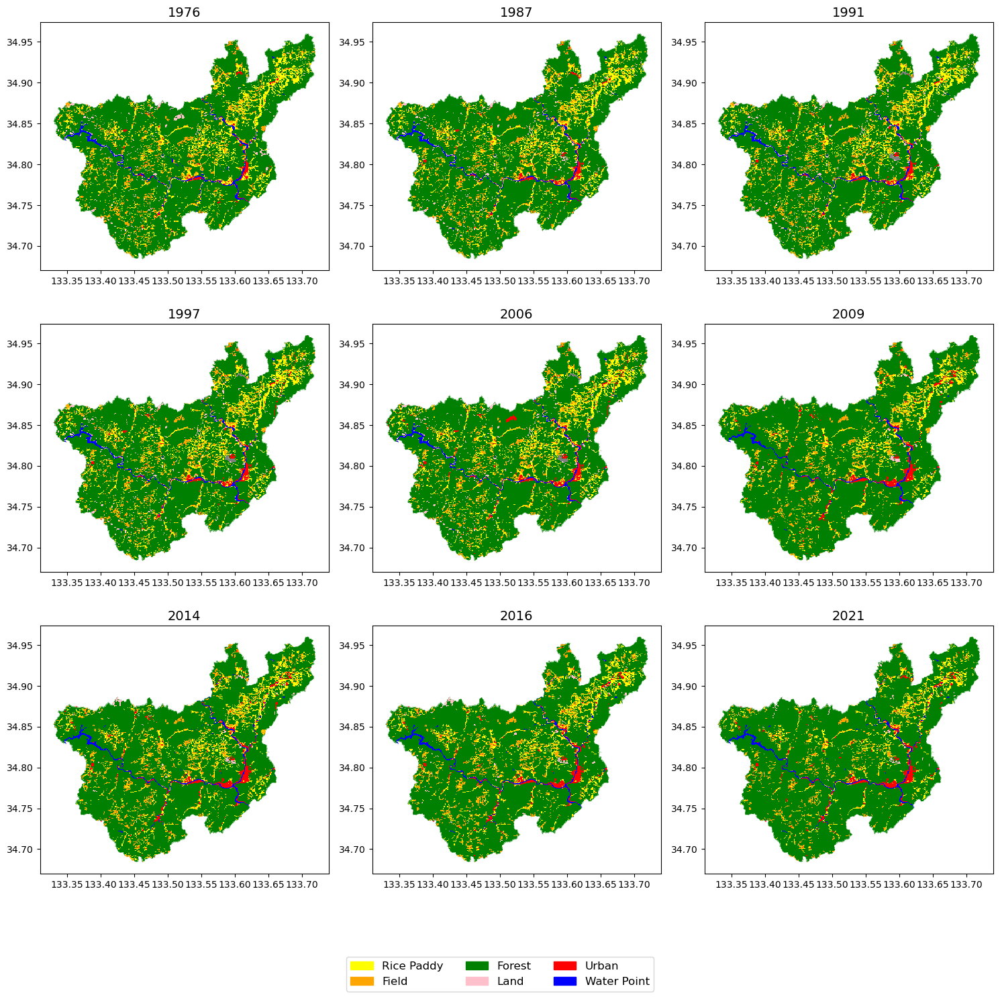

In [114]:
#各年の高梁市の土地利用のプロット

gdf_list = [
    gdf_1976_takahashi_clip, gdf_1987_takahashi_clip, gdf_1991_takahashi_clip,
    gdf_1997_takahashi_clip, gdf_2006_takahashi_clip, gdf_2009_takahashi_clip,
    gdf_2014_takahashi_clip, gdf_2016_takahashi_clip, gdf_2021_takahashi_clip
]
years = ['1976', '1987', '1991', '1997', '2006', '2009', '2014', '2016', '2021']

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
places = axes.flatten()


for ax, gdf, year in zip(places, gdf_list, years):
    plot_colors = gdf['new_landuse_code'].map(color_map).fillna(default_color)
    
    gdf.plot(ax=ax, color=plot_colors)
    ax.set_title(year, fontsize=14)

patches = [mpatches.Patch(color=color_map[code], label=labels[code]) for code in color_map] #colormapを凡例表示にするには必要
fig.legend(handles=patches, loc='lower center', ncol=3, fontsize=12)

plt.tight_layout()
plt.subplots_adjust(bottom=0.1)
plt.show()

##### 1.2.3.3 Foliumでの巨瀬町の土地利用地図表示

In [115]:
#巨瀬町内でClipする
#Clip with the boudary of Kose town
gdf_river_kose_clip = gpd.clip(gdf_river,gdf_kose)
gdf_1976_kose_clip = gpd.clip(gdf_1976[['new_landuse_code','geometry']],gdf_kose)
gdf_1987_kose_clip = gpd.clip(gdf_1987[['new_landuse_code','geometry']],gdf_kose)
gdf_1991_kose_clip = gpd.clip(gdf_1991[['new_landuse_code','geometry']],gdf_kose)
gdf_1997_kose_clip = gpd.clip(gdf_1997[['new_landuse_code','geometry']],gdf_kose)
gdf_2006_kose_clip = gpd.clip(gdf_2006[['new_landuse_code','geometry']],gdf_kose)
gdf_2009_kose_clip = gpd.clip(gdf_2009[['new_landuse_code','geometry']],gdf_kose)
gdf_2014_kose_clip = gpd.clip(gdf_2014[['new_landuse_code','geometry']],gdf_kose)
gdf_2016_kose_clip = gpd.clip(gdf_2016[['new_landuse_code','geometry']],gdf_kose)
gdf_2021_kose_clip = gpd.clip(gdf_2021[['new_landuse_code','geometry']],gdf_kose)

#Emptyなデータを削除
#Delete empty datas
gdf_river_kose_clip = gdf_river_kose_clip[~(gdf_river_kose_clip.geometry.is_empty)] 
gdf_1976_kose_clip = gdf_1976_kose_clip[~(gdf_1976_kose_clip.geometry.is_empty)] 
gdf_1987_kose_clip = gdf_1987_kose_clip[~(gdf_1987_kose_clip.geometry.is_empty)] 
gdf_1991_kose_clip = gdf_1991_kose_clip[~(gdf_1991_kose_clip.geometry.is_empty)] 
gdf_1997_kose_clip = gdf_1997_kose_clip[~(gdf_1997_kose_clip.geometry.is_empty)] 
gdf_2006_kose_clip = gdf_2006_kose_clip[~(gdf_2006_kose_clip.geometry.is_empty)] 
gdf_2009_kose_clip = gdf_2009_kose_clip[~(gdf_2009_kose_clip.geometry.is_empty)] 
gdf_2014_kose_clip = gdf_2014_kose_clip[~(gdf_2014_kose_clip.geometry.is_empty)] 
gdf_2016_kose_clip = gdf_2016_kose_clip[~(gdf_2016_kose_clip.geometry.is_empty)] 
gdf_2021_kose_clip = gdf_2021_kose_clip[~(gdf_2021_kose_clip.geometry.is_empty)] 


In [116]:

mymap = folium.Map(location=[34.88172880509565, 133.61513057018922], zoom_start=14,
    zoom_control=False,       
    scrollWheelZoom=False
#    ,dragging=False       
)
#巨瀬町内の任意の座標
#Random Coordinate in Kose town
#34.88172880509565, 133.61513057018922

In [117]:
#各年代の土地利用データをラジオボタンで表示切替できるようにする
#Allow radio buttons to toggle the display of land use data for each era.

tooltip_setting = folium.GeoJsonTooltip(
    fields=['new_landuse_code'],
    aliases=['土地利用:'],
    localize=True,
    sticky=False
)

style_landuse = lambda x: {
    'fillOpacity': 1,      
    'fillColor': color_map.get(x['properties'].get('new_landuse_code'),default_color)      
}

#地図への追加
#Add to map

folium.GeoJson(gdf_1976_kose_clip,name='1976',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_1987_kose_clip,name='1987',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_1991_kose_clip,name='1991',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_1997_kose_clip,name='1997',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_2006_kose_clip,name='2006',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_2009_kose_clip,name='2009',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_2014_kose_clip,name='2014',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_2016_kose_clip,name='2016',style_function = style_landuse, show=False).add_to(mymap)
folium.GeoJson(gdf_2021_kose_clip,name='2021',style_function = style_landuse, show=True).add_to(mymap)

#Tool_tipsを設定して2つ以上のレイヤーをaddするとなぜか地図が正常に表示されなくなってしまう
#本当はマウスカーソルを合わせた地点の土地利用コードを表示するなどしたい
#folium.GeoJson(gdf_1976_kose_clip,name='1976',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_1987_kose_clip,name='1987',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_1991_kose_clip,name='1991',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_1997_kose_clip,name='1997',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_2006_kose_clip,name='2006',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_2009_kose_clip,name='2009',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_2014_kose_clip,name='2014',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_2016_kose_clip,name='2016',style_function = style_landuse, tooltip=tooltip_setting, show=False).add_to(mymap)
#folium.GeoJson(gdf_2021_kose_clip,name='2021',style_function = style_landuse, tooltip=tooltip_setting, show=True).add_to(mymap)


style_river = lambda x: {
    'fillOpacity': 1,      
    'color': 'blue',    
    'weight': 5,           
    'opacity': 1           
}
folium.map.CustomPane("河川", z_index=500).add_to(mymap)

#河川データを重ねて表示
#Overlay river data
folium.GeoJson(gdf_river_kose_clip, name="河川",style_function=style_river,show=True ,control = False, pane="河川").add_to(mymap)

style_border_only = lambda x: {
    'fillOpacity': 0,      
    'color': 'black',    
    'weight': 3,           
    'opacity': 1           
}

#巨瀬町の区域を重ねて表示
#Overlapping areas of Kose Town
#folium.GeoJson(gdf_kose, name="巨瀬町",style_function=style_border_only ,control = False).add_to(mymap)


#レイヤーコントロールを追加(ラジオボタンの追加)
#Add layer control (add radio button)
folium.LayerControl().add_to(mymap)
mymap.save("./data/output/map_check.html")

In [118]:
#地図の表示
#Display map
mymap

### 1.3. 水田消失リスク可視化のためのデータ処理

水田や水田を構成する畔は生物多様性度が高いエリアであると指摘されている。既に巨瀬町および高梁市の大部分は森林に覆われており、その中に点在する水田は貴重な生物多様性度が高いエリアと考えることができる。\
1.2では1976年から2021年の巨瀬町における土地利用公開データの変化を地図上で可視化し、過去の変化を確認したが、本章では将来的に損失する水田を過去の遷移の傾向と地理的観点から予測するためのデータ処理を行う。

※しかしながら、水田消失の事由としては後継者不足や干ばつ、耕作機械の値上げ等も指摘されており、人口データや物価高等のデータを含めて予測することは将来的な課題である。


#### 1.3.1 学習データ構造

| 説明変数 | 概要 | 算出方法 |
| ------- | -----| ------- |
| 森林との距離 | 2016年時点での水田ポリゴンが最寄りの森林ポリゴンからどれだけ離れているか | ポリゴンの重心位置間の距離計算 |
| 人工物との距離 | 2016年時点での水田ポリゴンが最寄りの人工物ポリゴンからどれだけ離れているか | ポリゴンの重心位置間の距離計算 |
| 河川との距離 | 2016年時点での水田ポリゴンが最寄りの河川ポリゴンからどれだけ離れているか | ポリゴンの重心位置間の距離計算 |
| 畑との距離 | 2016年時点での水田ポリゴンが最寄りの畑ポリゴンからどれだけ離れているか | ポリゴンの重心位置間の距離計算 |
| 過去の消失点との距離 | 2016年時点での水田ポリゴンが最寄りの過去の水田消失ポリゴンからどれだけ離れているか | ポリゴンの重心位置間の距離計算 |
| 過去の発生点との距離 | 2016年時点での水田ポリゴンが最寄りの過去の水田発生ポリゴンからどれだけ離れているか | ポリゴンの重心位置間の距離計算 |
| 水田面積 | 2016年時点での水田ポリゴンの面積 | 正積投影座標系に変換してarea計算 |
| 水田地点の標高 (未使用) | 2016年時点での水田ポリゴンが位置する標高 | デジタル標高モデル(DEM)から取得 |


| 目的変数 | 概要 |
| -------- | ---- |
| 水田判定(0/1) | 2021年時点でその土地が水田であるか水田でないかの0/1ラベル |

#### 1.3.2 予測データ構造

| 説明変数 | 概要 | 算出方法 |
| ------- | -----| ------- |
| 森林との距離 | 2021年時点での水田ポリゴンが最寄りの森林ポリゴンからどれだけ離れているか | ポリゴンの重心位置間の距離計算 |
| 人工物との距離 | 2021年時点での水田ポリゴンが最寄りの人工物ポリゴンからどれだけ離れているか |ポリゴンの重心位置間の距離計算 |
| 河川との距離 | 2021年時点での水田ポリゴンが最寄りの河川ポリゴンからどれだけ離れているか |ポリゴンの重心位置間の距離計算 |
| 畑との距離 | 2021年時点での水田ポリゴンが最寄りの畑ポリゴンからどれだけ離れているか |ポリゴンの重心位置間の距離計算 |
| 過去の消失点との距離 | 2021年時点での水田ポリゴンが最寄りの過去の水田消失ポリゴンからどれだけ離れているか |ポリゴンの重心位置間の距離計算 |
| 過去の発生点との距離 | 2021年時点での水田ポリゴンが最寄りの過去の水田発生ポリゴンからどれだけ離れているか |ポリゴンの重心位置間の距離計算 |
| 水田面積 | 2021年時点での水田ポリゴンの面積 | 正積投影座標系に変換してarea計算 |
| 水田地点の標高 (未使用) | 2021年時点での水田ポリゴンが位置する標高 | デジタル標高モデル(DEM)から取得 |


| 目的変数 | 概要 |
| -------- | ---- |
| 水田確率 | 2022年以降で土地が水田であるか水田でないかの確率(0.0~1.0) |

In [119]:
#再定義した土地利用分類コードとgeometryのみを格納したGDFを作成
#Create a GDF that stores only the redefined land use classification code and geometry
gdf_1976_kose_clip = gdf_1976_kose_clip[['new_landuse_code', 'geometry']]
gdf_1987_kose_clip = gdf_1987_kose_clip[['new_landuse_code', 'geometry']]
gdf_1991_kose_clip = gdf_1991_kose_clip[['new_landuse_code', 'geometry']]
gdf_1997_kose_clip = gdf_1997_kose_clip[['new_landuse_code', 'geometry']]
gdf_2006_kose_clip = gdf_2006_kose_clip[['new_landuse_code', 'geometry']]
gdf_2009_kose_clip = gdf_2009_kose_clip[['new_landuse_code', 'geometry']]
gdf_2014_kose_clip = gdf_2014_kose_clip[['new_landuse_code', 'geometry']]
gdf_2016_kose_clip = gdf_2016_kose_clip[['new_landuse_code', 'geometry']]
gdf_2021_kose_clip = gdf_2021_kose_clip[['new_landuse_code', 'geometry']]

#### 1.3.3 学習データセットの作成

##### 1.3.3.1 岡山県高梁市の範囲でのデータの取得

2016年のデータセットでの事前調査にて巨瀬町内に存在する水田ポリゴンは全部で318件と、学習に用いるにはデータ量が十分ではないことが分かった。\
そのため、扱うデータ範囲を岡山県高梁市巨瀬町から岡山県高梁市までに拡大し、データ件数の拡充を行う。

In [120]:
#2016年での巨瀬町内の水田データ件数の確認
#Check the number of rice paddy data in Kose Town in 2016
print(gdf_2016_kose_clip['new_landuse_code'].value_counts())
#コード100が水田。データ件数が少ないのが分かる。
#Code 100 is paddy field. You can see that there are few data items.

new_landuse_code
500     1665
100      318
200      151
700       18
1100      18
600        2
Name: count, dtype: int64


In [121]:
#高梁市でのデータ件数の確認
#Check the number of data items in Takahashi City
gdf_2016_takahashi_clip['new_landuse_code'].value_counts()
#コード100の件数が3829件と十分な量があることが分かる
#We can see that there are 3829 cases of code 100, which is a sufficient amount.

new_landuse_code
500     42568
100      3829
200      3821
700      1246
1100      941
600       367
Name: count, dtype: int64

##### 1.3.3.2 学習用説明変数の作成

In [122]:
#水田のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only rice paddies
gdf_2016_takahashi_paddy = gdf_2016_takahashi_clip[gdf_2016_takahashi_clip['new_landuse_code'] == 100].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換 #Convert to JGD2011 for area and distance calculations

#畑のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only fields
gdf_2016_takahashi_field = gdf_2016_takahashi_clip[gdf_2016_takahashi_clip['new_landuse_code'] == 200].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換 #Convert to JGD2011 for area and distance calculations

#森林のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only forests
gdf_2016_takahashi_forest = gdf_2016_takahashi_clip[gdf_2016_takahashi_clip['new_landuse_code'] == 500].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換 #Convert to JGD2011 for area and distance calculations

#荒地のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only wasteland
gdf_2016_takahashi_land = gdf_2016_takahashi_clip[gdf_2016_takahashi_clip['new_landuse_code'] == 600].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換 #Convert to JGD2011 for area and distance calculations

#人工物のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting only of man-made objects
gdf_2016_takahashi_urban = gdf_2016_takahashi_clip[gdf_2016_takahashi_clip['new_landuse_code'] == 700].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換 #Convert to JGD2011 for area and distance calculations

#高梁市の河川データ作成
#Creating river data for Takahashi City
gdf_river_takahashi_clip = gpd.clip(gdf_river,gdf_takahashi).to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換 #Convert to JGD2011 for area and distance calculations


In [123]:
#面積データの追加
#Add area data
gdf_2016_takahashi_paddy['area'] = gdf_2016_takahashi_paddy.geometry.area

In [124]:
def get_nearest_distance(gdf_from, gdf_to, col_name):
    
    #最近傍のポリゴンを結合
    #Merge nearest polygons
    joined = gpd.sjoin_nearest(
        gdf_from,
        gdf_to,
        how="left",
        distance_col=col_name
    )
    
    #同距離のポリゴンを検知し、複数行に増えた際に1行のみを取得する
    #Detect polygons at the same distance and obtain only one line when it increases to multiple lines
    distances = joined[col_name].groupby(joined.index).first()
    return distances

gdf_2016_takahashi_paddy_centroid=gdf_2016_takahashi_paddy.copy()
gdf_2016_takahashi_paddy_centroid['geometry']=gdf_2016_takahashi_paddy_centroid['geometry'].centroid

#水田からの各要素への距離を説明変数として追加していく
#Add the distance from the rice paddy to each element as an explanatory variable
gdf_2016_takahashi_paddy['dist_field'] = get_nearest_distance(gdf_2016_takahashi_paddy_centroid,gdf_2016_takahashi_field, 'dist_field')
gdf_2016_takahashi_paddy['dist_forest'] = get_nearest_distance(gdf_2016_takahashi_paddy_centroid,gdf_2016_takahashi_forest, 'dist_forest')
gdf_2016_takahashi_paddy['dist_land'] = get_nearest_distance(gdf_2016_takahashi_paddy_centroid,gdf_2016_takahashi_land, 'dist_land')
gdf_2016_takahashi_paddy['dist_urban'] = get_nearest_distance(gdf_2016_takahashi_paddy_centroid,gdf_2016_takahashi_urban, 'dist_urban')
gdf_2016_takahashi_paddy['dist_river'] = get_nearest_distance(gdf_2016_takahashi_paddy_centroid,gdf_river_takahashi_clip, 'dist_river')

In [125]:
#2006年と比較して2016年で水田が消失した場所までの距離も説明変数として追加する
#消失した水田の位置(geometry)を記録したデータフレームを作成する
#Add the distance to the location of rice paddy loss in 2016 compared to 2006 as an explanatory variable.
#Create a data frame recording the location (geometry) of lost rice paddies.

gdf_2006_takahashi_clip = gdf_2006_takahashi_clip[gdf_2006_takahashi_clip['new_landuse_code']==100].to_crs(epsg=6674)
gdf_2006_takahashi_clip_centroid = gdf_2006_takahashi_clip.copy()
gdf_2006_takahashi_clip_centroid['geometry'] = gdf_2006_takahashi_clip_centroid.centroid

joined = gpd.sjoin(gdf_2006_takahashi_clip_centroid,gdf_2016_takahashi_paddy,how='left',predicate='within')

joined
#このjoinedには2006年と2016年を比較した際に2016年に水田として残存している行のみのindex_right列やその他の列が値を持つ
#そのため、それらの列でNaNを含む行の水田は消失したと捉えることができる
#When comparing 2006 and 2016, this joined column contains values ​​in the index_right column and other columns only for rows that remained as paddy fields in 2016.
#Therefore, we can consider that paddy fields with NaN in those columns have disappeared.


,new_landuse_code_left,geometry,index_right,new_landuse_code_right,area,dist_field,dist_forest,dist_land,dist_urban,dist_river
47628,100,POINT (-221369.466 -138196.825),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47648,100,POINT (-221365.024 -138011.913),47648.0,100.0,10591.870124,722.534307,46.241105,4362.532245,714.573952,28.482669
46522,100,POINT (-223223.827 -139077.197),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46523,100,POINT (-223109.317 -139079.969),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46459,100,POINT (-223512.729 -138810.92),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
280557,100,POINT (-222081.945 -116629.048),280557.0,100.0,5693.676041,436.825208,31.720841,1891.476529,1815.671359,4.609417
281517,100,POINT (-222088.054 -116111.498),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
283863,100,POINT (-219068.624 -113829.381),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
283722,100,POINT (-220333.656 -114169.023),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [126]:
#isnaを用いて消失した水田(NaNを含む行)を抽出
#Extract missing paddy fields (rows containing NaN) using isna
gdf_paddy_lost = gdf_2006_takahashi_clip[joined['index_right'].isna()]
gdf_paddy_lost

gdf_2016_takahashi_paddy['dist_paddy_lost'] = get_nearest_distance(gdf_2016_takahashi_paddy_centroid,gdf_paddy_lost, 'dist_paddy_lost')
gdf_2016_takahashi_paddy['dist_paddy_lost'] = gdf_2016_takahashi_paddy['dist_paddy_lost'].fillna(99999)


##### 1.3.3.3 DEMからの標高データ取得 (精度が低下したので学習には用いていない)

[国土地理院](https://service.gsi.go.jp/kiban/app/map/?search=dem#10/34.81770905501085/133.81041047232554)より提供されるデジタル標高モデル(DEM)を取得し、各水田の標高も説明変数として入力する。\
提供されるDEMは5mメッシュのデータであり、上記のサイトで公開されている岡山県高梁市のデータで一番古いものが2023年時点のデータなのでそちらを採用する。\
GEEを用いてDEMを取得することも考えたが、GEEで取得可能なDEMは30mメッシュのものであり、入り組んだ地形の高梁市の分析には不向きだと判断して国土地理院が公開しているDEMを採用した。

国土地理院より提供されるDEMはGML(Geography Markup Language)方式で構成されており、そのままではPython環境での分析には用いることはできない。\
そこで、Web上で公開されているGML->GeoTiffの変換スクリプトを用いて複数のGMLファイルをGeoTiffに変換し、GDALを用いて最終的に1つのGeoTiffを生成した。\
[参考にしたサイトはこちら。](https://qiita.com/HidKamiya/items/66b1d98503301446460c)ファイルの読み込みルールが最新のGMLファイルに適していなかったので修正して使用。

※実際、生成したDEMには提供されていないエリアも含まれており、空白部分があったが、高梁市にはわずかに未観測地域があるだけで学習には問題ないと判断した。

<figure>
  <img src="./data/Output/img/python_gen_geotiff.jpg" width="50%">
  <figcaption>QGISで表示したDEM</figcaption>
</figure>

In [127]:
#dem_path = r'/home/jovyan/work/data/dem_2023_takahashi/2023_dem_merged.tif'
#
#with rio.open(dem_path) as src:
#    if gdf_2016_takahashi_paddy.crs != src.crs:
#        gdf_2016_takahashi_paddy_tmp = gdf_2016_takahashi_paddy.to_crs(src.crs)
#    else:
#        gdf_2016_takahashi_paddy_tmp = gdf_2016_takahashi_paddy
#    
#    coords_list = [(polygon.centroid.x,polygon.centroid.y) for polygon in gdf_2016_takahashi_paddy_tmp.geometry]
#
#    sample_values = src.sample(coords_list)
#
#    elevations = [val[0] for val in sample_values]
#
#
#gdf_2016_takahashi_paddy['elevation'] = elevations
#
#gdf_2016_takahashi_paddy['elevation'] = gdf_2016_takahashi_paddy['elevation'].replace(-9999,np.nan)
#gdf_2016_takahashi_paddy['elevation'] = gdf_2016_takahashi_paddy['elevation'].dropna()
#
#len(gdf_2016_takahashi_paddy)


##### 1.3.3.4 学習用目的変数の作成

In [128]:
gdf_2016_takahashi_paddy #学習用データ(説明変数を確認) #Learning data (check explanatory variables)

,new_landuse_code,geometry,area,dist_field,dist_forest,dist_land,dist_urban,dist_river,dist_paddy_lost
47648,100,"POLYGON ((-221421.161 -137964.31, -221306.666 ...",10591.870124,722.534307,46.241105,4362.532245,714.573952,28.482669,138.723201
47658,100,"POLYGON ((-221418.94 -137871.855, -221304.446 ...",10591.764991,801.121889,57.263688,4336.949276,625.199066,11.261798,150.077809
47668,100,"POLYGON ((-221416.718 -137779.399, -221302.225...",10591.659856,809.614243,46.241271,4313.197978,536.877791,46.383334,73.602379
46562,100,"POLYGON ((-223271.004 -138659.758, -223156.499...",10592.923427,150.080949,46.241522,3076.679635,1202.654439,15.516365,238.195124
46634,100,"POLYGON ((-221903.627 -138970.308, -221789.119...",10593.079356,46.241312,46.241157,4357.599286,238.193485,349.675304,46.241569
...,...,...,...,...,...,...,...,...,...
293457,100,"POLYGON ((-211818.555 -114046.511, -211704.364...",10563.339728,220.449770,46.240534,2300.248165,629.922199,593.607804,138.721021
292731,100,"POLYGON ((-209103.361 -115219.067, -208989.157...",10564.307983,317.494990,46.239653,2692.454898,1023.536740,57.063925,73.487908
280555,100,"POLYGON ((-222279.707 -116666.024, -222334.595...",3971.705743,549.830713,31.825196,1887.258383,1923.234435,22.480798,543.304445
280556,100,"POLYGON ((-222278.426 -116613.293, -222255.47 ...",2478.124585,498.189788,18.142742,1869.735792,1877.614524,5.870097,543.280977


In [129]:
#2016年と2021年のデータを比較して、2016年に水田だった場所が水田以外に変化していた場合に1を設定する
#Compare the data from 2016 and 2021, and set it to 1 if an area that was a rice paddy in 2016 has changed to something other than rice paddy.

gdf_2021_takahashi_clip = gdf_2021_takahashi_clip.to_crs(epsg=6674)

joined = gpd.sjoin(gdf_2016_takahashi_paddy_centroid,gdf_2021_takahashi_clip,how='left',predicate='within')

joined

,new_landuse_code_left,geometry,area,index_right,new_landuse_code_right
47648,100,POINT (-221365.024 -138011.913),10591.870124,47648.0,500.0
47658,100,POINT (-221362.803 -137919.458),10591.764991,47658.0,500.0
47668,100,POINT (-221360.582 -137827.002),10591.659856,47668.0,100.0
46562,100,POINT (-223214.871 -138707.373),10592.923427,46562.0,500.0
46634,100,POINT (-221847.486 -139017.913),10593.079356,46634.0,100.0
...,...,...,...,...,...
293457,100,POINT (-211762.531 -114094.062),10563.339728,293457.0,100.0
292731,100,POINT (-209047.316 -115266.6),10564.307983,292731.0,500.0
280555,100,POINT (-222311.489 -116633.418),3971.705743,280555.0,100.0
280556,100,POINT (-222248.862 -116648.626),2478.124585,280556.0,100.0


In [130]:
gdf_2016_takahashi_paddy['paddy'] = 1
gdf_2016_takahashi_paddy.loc[joined['new_landuse_code_right']==100,'paddy'] = 0

#最終的な学習データの作成が完了
#Final training data creation completed
gdf_2016_takahashi_paddy

,new_landuse_code,geometry,area,dist_field,dist_forest,dist_land,dist_urban,dist_river,dist_paddy_lost,paddy
47648,100,"POLYGON ((-221421.161 -137964.31, -221306.666 ...",10591.870124,722.534307,46.241105,4362.532245,714.573952,28.482669,138.723201,1
47658,100,"POLYGON ((-221418.94 -137871.855, -221304.446 ...",10591.764991,801.121889,57.263688,4336.949276,625.199066,11.261798,150.077809,1
47668,100,"POLYGON ((-221416.718 -137779.399, -221302.225...",10591.659856,809.614243,46.241271,4313.197978,536.877791,46.383334,73.602379,0
46562,100,"POLYGON ((-223271.004 -138659.758, -223156.499...",10592.923427,150.080949,46.241522,3076.679635,1202.654439,15.516365,238.195124,1
46634,100,"POLYGON ((-221903.627 -138970.308, -221789.119...",10593.079356,46.241312,46.241157,4357.599286,238.193485,349.675304,46.241569,0
...,...,...,...,...,...,...,...,...,...,...
293457,100,"POLYGON ((-211818.555 -114046.511, -211704.364...",10563.339728,220.449770,46.240534,2300.248165,629.922199,593.607804,138.721021,0
292731,100,"POLYGON ((-209103.361 -115219.067, -208989.157...",10564.307983,317.494990,46.239653,2692.454898,1023.536740,57.063925,73.487908,1
280555,100,"POLYGON ((-222279.707 -116666.024, -222334.595...",3971.705743,549.830713,31.825196,1887.258383,1923.234435,22.480798,543.304445,0
280556,100,"POLYGON ((-222278.426 -116613.293, -222255.47 ...",2478.124585,498.189788,18.142742,1869.735792,1877.614524,5.870097,543.280977,0


#### 1.3.4 水田喪失リスクの予測モデルの作成

本予測では予測モデルの作成はランダムフォレストを用いて行う。
ランダムフォレストを採用した理由としては以下の通りである。
- 各学習要素が非線形である
- 面積と距離という異なる単位の値であっても学習に使用できる

In [131]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

In [132]:
features = [
    'area',
    'dist_field',
    'dist_forest',
    'dist_land',
    'dist_urban',
    'dist_river',
    'dist_paddy_lost'
#    ,'elevation' 精度が落ちたので削除
]


X = gdf_2016_takahashi_paddy[features].fillna(99999) #欠損値には巨大な値を入れて対応 #Missing values ​​are handled by inserting huge values
y = gdf_2016_takahashi_paddy['paddy']

X_train,X_test,y_train,y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=123
)

model = RandomForestClassifier(
    n_estimators=100,       
    max_depth=10,           
    class_weight='balanced', 
    random_state=123,
    n_jobs=-1               
)

model.fit(X_train, y_train)


RandomForestClassifier(class_weight='balanced', max_depth=10, n_jobs=-1,
                       random_state=123)


=== 閾値 0.41 ===
              precision    recall  f1-score   support

           0       0.85      0.72      0.78       862
           1       0.43      0.62      0.51       287

    accuracy                           0.70      1149
   macro avg       0.64      0.67      0.64      1149
weighted avg       0.75      0.70      0.71      1149

AUC Score: 0.7155


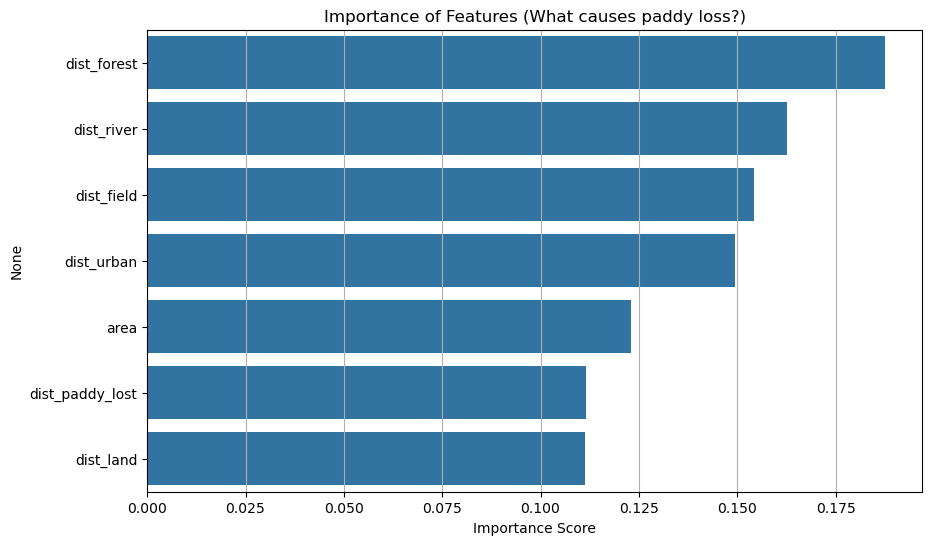

In [133]:
#リスクを確認したいのでpredict_probaを使用
#Use predict_proba to check the risk
y_pred_prob = model.predict_proba(X_test)[:, 1]

#確率が30%以上で消失(1)とみなす
#Probability is 30% or more and considered as disappearance (1)
threshold = 0.41
y_pred_strict = (y_pred_prob >= threshold).astype(int)

#cm = confusion_matrix(y_test, y_pred_strict)
#print("\nConfusion Matrix:")
#print(cm)

print(f"\n=== 閾値 {threshold} ===")
print(classification_report(y_test, y_pred_strict))

auc_score = roc_auc_score(y_test, y_pred_prob)
print(f'AUC Score: {auc_score:.4f}')

#モデル生成における説明変数の重要度を確認してみる
#Check the importance of explanatory variables in model generation
feature_imp = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.title("Importance of Features (What causes paddy loss?)")
plt.xlabel("Importance Score")
plt.grid(axis='x')
plt.show()


Best Threshold: 0.4186
Max F1 Score at the Best Threshold:   0.5087
Precision at the Best Threshold: 0.4364
Recall at the Best Threshold:    0.6098


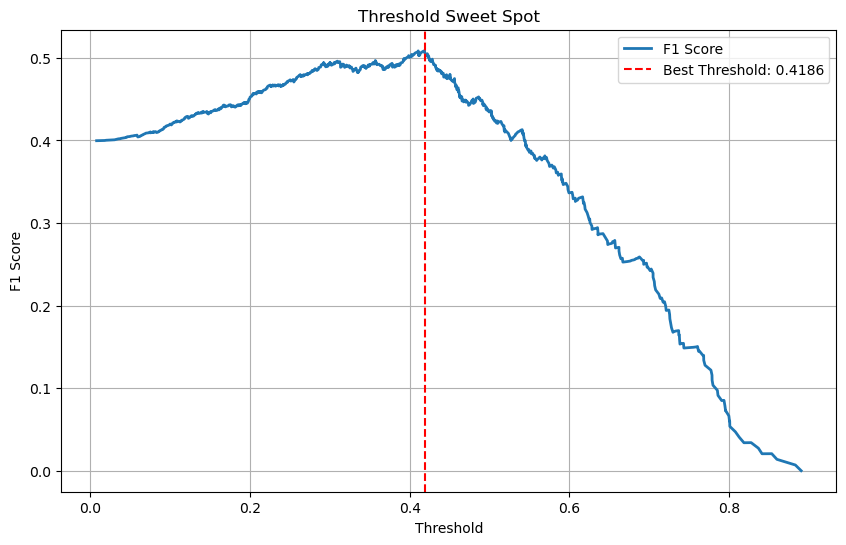

In [134]:
from sklearn.metrics import precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]

print(f"Best Threshold: {best_threshold:.4f}")
print(f"Max F1 Score at the Best Threshold:   {f1_scores.max():.4f}")
print(f"Precision at the Best Threshold: {precision[best_idx]:.4f}")
print(f"Recall at the Best Threshold:    {recall[best_idx]:.4f}")

plt.figure(figsize=(10, 6))
plt.plot(thresholds, f1_scores[:-1], label="F1 Score", linewidth=2)
plt.axvline(best_threshold, color='red', linestyle='--', label=f'Best Threshold: {best_threshold:.4f}')
plt.title("Threshold Sweet Spot")
plt.xlabel("Threshold")
plt.ylabel("F1 Score")
plt.legend()
plt.grid(True)
plt.show()

上記のprecision_recall_curveを利用してラベル1(水田消失)のF1値が最大になる閾値を探索したところ、0.41であった。\
0.41の閾値を用いたclassification_reportより、accuracyは0.70、AUC(Area Under Curve)は0.715とデタラメではないが最低基準のモデルが生成できた。\
Recallは0.61と61%の確率で消失する水田を特定している。

精度としては高くはなく、このモデルの精度をどう向上させるかが今後の課題である。\
ただ、先述したように、水田消失の事由としては後継者不足や干ばつ、耕作機械の値上げ等も指摘されているので難易度は高そう。

#### 1.3.5. 予測データセットの作成

In [135]:
gdf_2021_takahashi_clip['new_landuse_code'].value_counts()

new_landuse_code
500     44828
100      2844
200      2680
700      1298
1100      933
600       189
Name: count, dtype: int64

In [136]:
#水田のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only rice paddies
gdf_2021_takahashi_paddy = gdf_2021_takahashi_clip[gdf_2021_takahashi_clip['new_landuse_code'] == 100].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換

#畑のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only fields
gdf_2021_takahashi_field = gdf_2021_takahashi_clip[gdf_2021_takahashi_clip['new_landuse_code'] == 200].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換

#森林のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only forests
gdf_2021_takahashi_forest = gdf_2021_takahashi_clip[gdf_2021_takahashi_clip['new_landuse_code'] == 500].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換

#荒地のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting of only wasteland
gdf_2021_takahashi_land = gdf_2021_takahashi_clip[gdf_2021_takahashi_clip['new_landuse_code'] == 600].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換

#人工物のみで構成されたGeoDataFrameの作成
#Create a GeoDataFrame consisting only of man-made objects
gdf_2021_takahashi_urban = gdf_2021_takahashi_clip[gdf_2021_takahashi_clip['new_landuse_code'] == 700].to_crs(epsg=6674) #面積・距離計算のためにJGD2011に変換


In [137]:
#面積データの追加
#Add area data
gdf_2021_takahashi_paddy['area'] = gdf_2021_takahashi_paddy.geometry.area

In [138]:
gdf_2021_takahashi_paddy_centroid=gdf_2021_takahashi_paddy.copy()
gdf_2021_takahashi_paddy_centroid['geometry']=gdf_2021_takahashi_paddy_centroid['geometry'].centroid

In [139]:
#水田からの各要素への距離を説明変数として追加していく
#Add the distance from the rice paddy to each element as an explanatory variable
gdf_2021_takahashi_paddy['dist_field'] = get_nearest_distance(gdf_2021_takahashi_paddy_centroid,gdf_2021_takahashi_field, 'dist_field')
gdf_2021_takahashi_paddy['dist_forest'] = get_nearest_distance(gdf_2021_takahashi_paddy_centroid,gdf_2021_takahashi_forest, 'dist_forest')
gdf_2021_takahashi_paddy['dist_land'] = get_nearest_distance(gdf_2021_takahashi_paddy_centroid,gdf_2021_takahashi_land, 'dist_land')
gdf_2021_takahashi_paddy['dist_urban'] = get_nearest_distance(gdf_2021_takahashi_paddy_centroid,gdf_2021_takahashi_urban, 'dist_urban')
gdf_2021_takahashi_paddy['dist_river'] = get_nearest_distance(gdf_2021_takahashi_paddy_centroid,gdf_river_takahashi_clip, 'dist_river')

In [140]:
#2016年と比較して2021年で水田が消失した場所までの距離も説明変数として追加する
#消失した水田の位置(geometry)を記録したデータフレームを作成する
#Add the distance to the location of lost rice paddies in 2021 compared to 2016 as an explanatory variable.
#Create a data frame recording the location (geometry) of lost rice paddies.
gdf_2016_takahashi_clip_tmp = gdf_2016_takahashi_clip[gdf_2016_takahashi_clip['new_landuse_code']==100].to_crs(epsg=6674)
gdf_2016_takahashi_clip_tmp_centroid = gdf_2016_takahashi_clip_tmp.copy()
gdf_2016_takahashi_clip_tmp_centroid['geometry'] = gdf_2016_takahashi_clip_tmp_centroid.centroid

joined = gpd.sjoin(gdf_2016_takahashi_clip_tmp_centroid,gdf_2021_takahashi_paddy,how='left',predicate='within')

joined


,new_landuse_code_left,geometry,index_right,new_landuse_code_right,area,dist_field,dist_forest,dist_land,dist_urban,dist_river
47648,100,POINT (-221365.024 -138011.913),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47658,100,POINT (-221362.803 -137919.458),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47668,100,POINT (-221360.582 -137827.002),47668.0,100.0,10591.655620,882.407389,46.241098,7890.089073,536.877809,46.383319
46562,100,POINT (-223214.871 -138707.373),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46634,100,POINT (-221847.486 -139017.913),46634.0,100.0,10593.075119,46.241294,46.241139,9148.553374,238.193503,349.675291
...,...,...,...,...,...,...,...,...,...,...
293457,100,POINT (-211762.531 -114094.062),293457.0,100.0,10563.348178,289.273756,46.240571,1623.754592,629.922202,593.607804
292731,100,POINT (-209047.316 -115266.6),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
280555,100,POINT (-222311.489 -116633.418),280555.0,100.0,3971.707774,558.979828,31.825217,358.471089,1923.234389,22.480813
280556,100,POINT (-222248.862 -116648.626),280556.0,100.0,2478.128811,519.806871,18.142748,321.099308,1877.614442,5.870101


In [141]:
gdf_paddy_lost = gdf_2016_takahashi_clip_tmp[joined['index_right'].isna()]
gdf_paddy_lost

gdf_2021_takahashi_paddy['dist_paddy_lost'] = get_nearest_distance(gdf_2021_takahashi_paddy_centroid,gdf_paddy_lost, 'dist_paddy_lost')
gdf_2021_takahashi_paddy['dist_paddy_lost'] = gdf_2021_takahashi_paddy['dist_paddy_lost'].fillna(99999) #欠損値には例外的な値で処理 #Missing values ​​are treated as exceptional values

In [142]:
#gdf_2021_city_paddy #予測用データ(説明変数を確認) #Prediction data (check explanatory variables)

#### 1.3.6. 2021年のデータを用いて水田消失リスクを可視化する

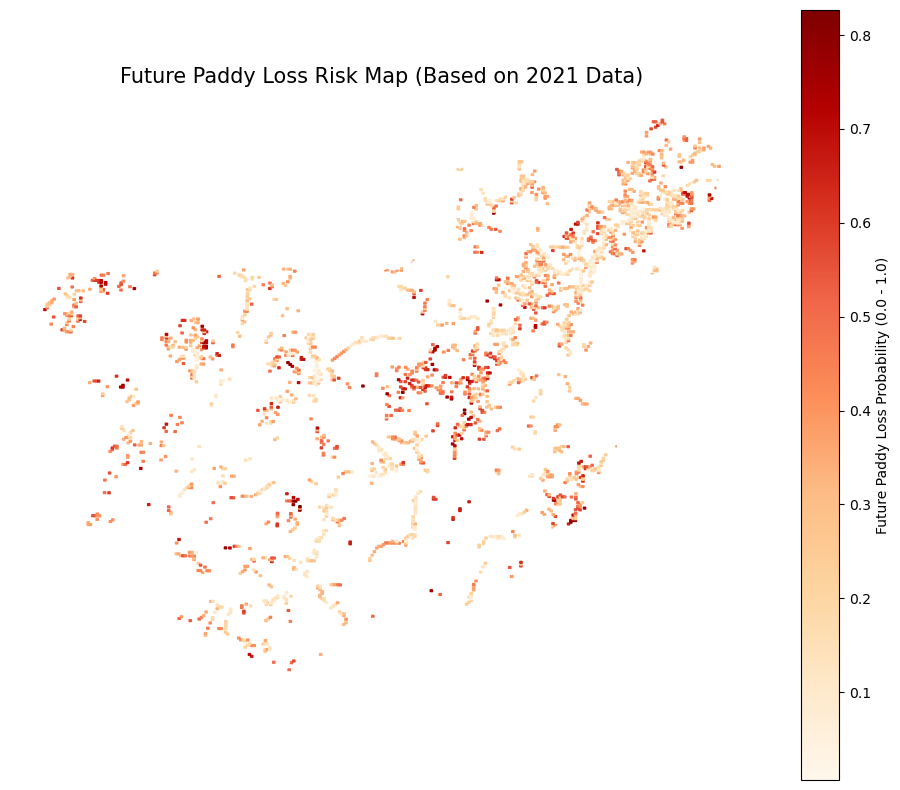

In [143]:
#学習時に用いた特徴量を2021年のデータから抽出し、モデルに入力する
#Extract the features used during learning from the 2021 data and input them into the model
X_2021 = gdf_2021_takahashi_paddy[features].copy()
predicted_prob = model.predict_proba(X_2021)[:, 1]

gdf_2021_takahashi_paddy['future_loss_risk'] = predicted_prob #新要素として損失確率を格納する #Store the loss probability as a new element


fig, ax = plt.subplots(figsize=(12, 10))
#リスク確率に基づいて色分け
#Color-coded based on risk probability
gdf_2021_takahashi_paddy.plot(
    column='future_loss_risk',
    ax=ax,
    legend=True,
    legend_kwds={'label': "Future Paddy Loss Probability (0.0 - 1.0)"},
    cmap='OrRd',
    edgecolor='face'
)

plt.title('Future Paddy Loss Risk Map (Based on 2021 Data)', fontsize=15)
plt.axis('off')
plt.show()

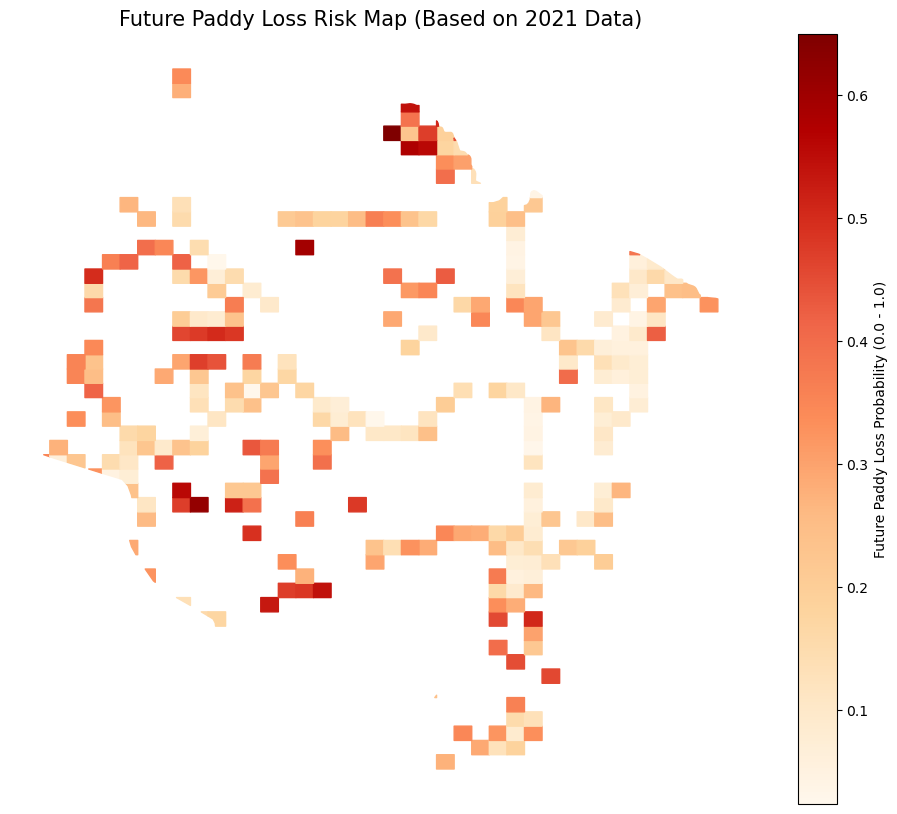

In [144]:
gdf_kose_paddy_pred = gpd.clip(gdf_2021_takahashi_paddy.to_crs(4326),gdf_kose)
#巨瀬町のスケールでも確認してみる
#Check it out on the scale of Kose Town

fig, ax = plt.subplots(figsize=(12, 10))

gdf_kose_paddy_pred.plot(
    column='future_loss_risk',
    ax=ax,
    legend=True,
    legend_kwds={'label': "Future Paddy Loss Probability (0.0 - 1.0)"},
    cmap='OrRd',
    edgecolor='face'
)

plt.title('Future Paddy Loss Risk Map (Based on 2021 Data)', fontsize=15)
plt.axis('off')
plt.show()

#### 1.3.7. 1.2.3.2 で表示したFoliumの地図に重ねて表示してみる

In [145]:
import branca.colormap as cm

mymap2 = folium.Map(location=[34.88172880509565, 133.61513057018922], zoom_start=14,tiles=None,
    zoom_control=False,       
    scrollWheelZoom=False,        
    dragging=False         
)

colormap_blue = cm.LinearColormap(
    colors=['lightblue', 'blue', 'navy'], 
    vmin=0, 
    vmax=1
)


folium.GeoJson(
    gdf_kose_paddy_pred, 
    name="Future Paddy Loss Risk",
    style_function=lambda feature: {
        'fillColor': colormap_blue(feature['properties']['future_loss_risk']), 
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.7
    }
).add_to(mymap2)


colormap_blue.caption = 'Future Loss Risk'
colormap_blue.add_to(mymap2)

#地図への追加
#Add to map
folium.map.CustomPane("2021", z_index=300).add_to(mymap2)
folium.GeoJson(gdf_2021_kose_clip,name='2021',style_function = style_landuse, show=True, control=False, pane='2021').add_to(mymap2)

style_river = lambda x: {
    'fillOpacity': 1,      
    'color': 'blue',    
    'weight': 5,           
    'opacity': 1           
}
folium.map.CustomPane("河川", z_index=600).add_to(mymap2)

#河川データを重ねて表示
#Overlay river data
folium.GeoJson(gdf_river_kose_clip, name="河川",style_function=style_river,show=True ,control = False, pane="河川").add_to(mymap2)

folium.LayerControl().add_to(mymap2)

mymap2
mymap2.save("./data/output/2021vsfuture.html")

### 1.4. NDVI画像を用いて分析の妥当性を確認してみる

ここまでは行政の公開しているデータを用いての水田損失リスクの可視化であったが、この章では実際の衛星画像を用いてNDVI(Normalized Difference Vegetation Index)の算出を行い、\
作成したモデルが損失リスクが高いと判定した地点が、2025年の夏時点で水田として維持されているかどうかを評価する。

本検証の意義としては、行政データを用いて作成されたモデルの予測した結果が、実世界の物理データと比較した際の妥当性を確認するという点にある。

#### 1.4.1. GEE(Google Earth Engine)との接続

1.4章ではGoogle Earth Engineより衛星画像(Sentinel-2)を取得し、NDVIを比較して水田が現存している地点を特定する。

水田は春の田植えの時期に水が張られるため、その地点のNDVI値は0近辺の低い値を記録するが、夏の成長期になると、稲が生長し、水田全体で生い茂るため、NDVI値は0.8近辺の高い値を記録する。

このような短期間でNDVI値が上昇する箇所を水田とみなし、本分析を行う。

In [147]:
import ee
import requests
import zipfile
import io
from folium import raster_layers
from rasterio.plot import show as rio_show
from rasterio.mask import mask as  rio_mask

ee.Authenticate(auth_mode='notebook') 
#the box belowと言われる。しかし実際は出力セルには入力ボックスは表示されず、VSCODEの上部にboxが出現するので注意
# It says the box below. However, in reality, the input box is not displayed in the output cell, but a box appears at the top of VSCODE.
ee.Initialize()

#### 1.4.2 衛星画像の取得

In [148]:
#Set region and season
#範囲と季節の設定
coords = ee.Geometry.Rectangle([133.3215, 34.6645, 133.7845, 34.9863])
SPRING_START_DATE ='2025-04-01'
SPRING_END_DATE = '2025-06-30'
SUMMER_START_DATE ='2025-07-01'
SUMMER_END_DATE = '2025-08-31'
CLOUD_COVER_RATE = 30

#Get Image of each season
#各季節の衛星画像を取得
spring_imgcol = (
  ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
  .filterBounds(coords)
  .filterDate(ee.Date(SPRING_START_DATE), ee.Date(SPRING_END_DATE))
  .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_COVER_RATE))
  .median()
  .clip(coords)
)

summer_imgcol = (
  ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
  .filterBounds(coords)
  .filterDate(ee.Date(SUMMER_START_DATE), ee.Date(SUMMER_END_DATE))
  .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_COVER_RATE))
  .median()
  .clip(coords)
)


#NDVI
#NDVI画像を生成
spring_ndvi = spring_imgcol.normalizedDifference(['B8', 'B4']).rename('NDVI')
summer_ndvi = summer_imgcol.normalizedDifference(['B8', 'B4']).rename('NDVI')

#Caluculate the difference of NDVI
#NDVI画像の差分を生成
diff_ndvi = summer_ndvi.subtract(spring_ndvi).rename('NDVI_Diff')

#Download
spring_url_ndvi = spring_ndvi.getDownloadURL({
    'name': 'takahashi_ndvi_2025_sp',
    'crs': 'EPSG:4326',    
    'scale': 30, 
    'region': coords,
    'filePerBand': False
})

summer_url_ndvi = summer_ndvi.getDownloadURL({
    'name': 'takahashi_ndvi_2025_sm',
    'crs': 'EPSG:4326',    
    'scale': 30, 
    'region': coords,
    'filePerBand': False
})

diff_url_ndvi = diff_ndvi.getDownloadURL({
    'name': 'takahashi_ndvi_2025_diff',
    'crs': 'EPSG:4326',    
    'scale': 30, 
    'region': coords,
    'filePerBand': False
})

ndvi_url_list = [spring_url_ndvi,summer_url_ndvi,diff_url_ndvi]

for ndvi_url in ndvi_url_list:
    response = requests.get(ndvi_url)
    z = zipfile.ZipFile(io.BytesIO(response.content))
    z.extractall("./data/satelite_image")

#### 1.4.3 春(4月-6月)と夏(7月-8月)のNDVI画像の表示

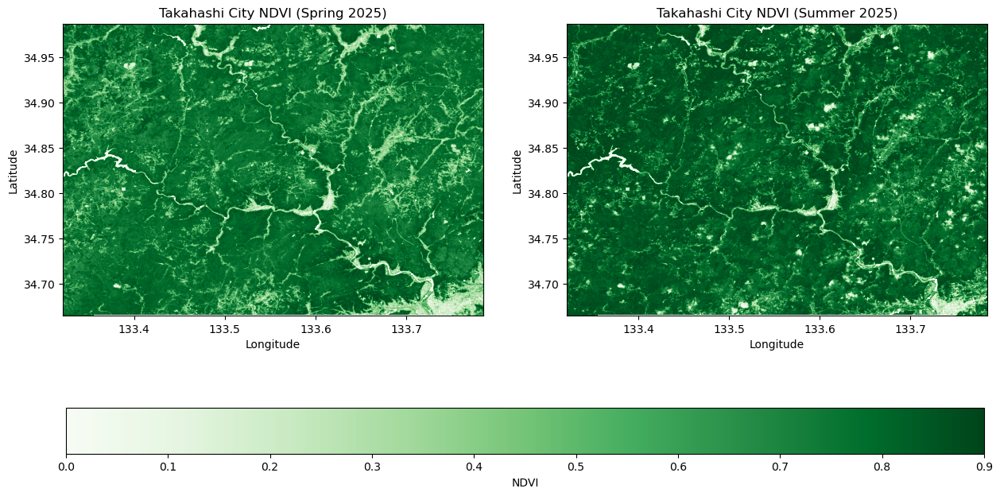

In [173]:
tif_path_summer = "data/satelite_image/takahashi_ndvi_2025_sm.tif"
tif_path_spring = "data/satelite_image/takahashi_ndvi_2025_sp.tif"

#春夏のNDVI画像の表示

fig, axes = plt.subplots(1, 2, figsize=(15, 15))
with rio.open(tif_path_spring) as src:
    ndvi = src.read(1)
    ndvi = np.where(ndvi == src.nodata, np.nan, ndvi)
    
    img = axes[0].imshow(ndvi, cmap='Greens', vmin=0, vmax=0.9, 
                    extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top])

    axes[0].set_title("Takahashi City NDVI (Spring 2025)")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")


with rio.open(tif_path_summer) as src:
    ndvi = src.read(1)
    ndvi = np.where(ndvi == src.nodata, np.nan, ndvi)
    
    img = axes[1].imshow(ndvi, cmap='Greens', vmin=0, vmax=0.9, 
                    extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top])

    axes[1].set_title("Takahashi City NDVI (Summer 2025)")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    
fig.colorbar(img, ax=axes, orientation='horizontal', fraction=0.05, pad=0.1,label='NDVI')
plt.show()



#### 1.4.4 差分NDVI画像のプロットと閾値処理

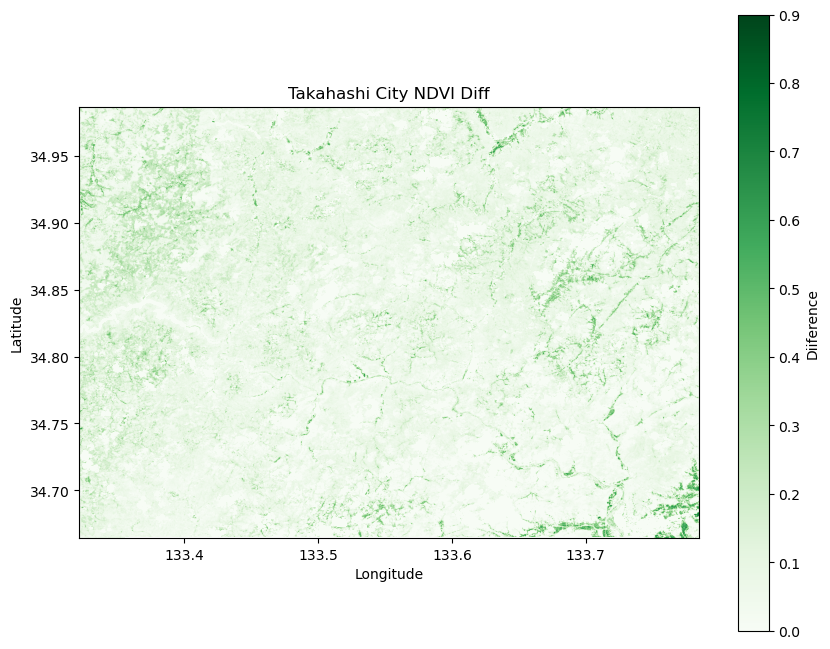

In [157]:
path = "data/satelite_image/takahashi_ndvi_2025_diff.tif"
with rio.open(path) as src:
    ndvi = src.read(1)
    ndvi = np.where(ndvi == src.nodata, np.nan, ndvi)

    fig, ax = plt.subplots(figsize=(10, 8))

    # imshowを使って直接描画（extentで座標系を維持）
    # origin='upper' は画像データが上から順に並んでいるため
    img = ax.imshow(ndvi, cmap='Greens', vmin=0, vmax=0.9, 
                    extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top])

    ax.set_title("Takahashi City NDVI Diff")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    
    plt.colorbar(img, ax=ax, label='Diiference')
    plt.show()

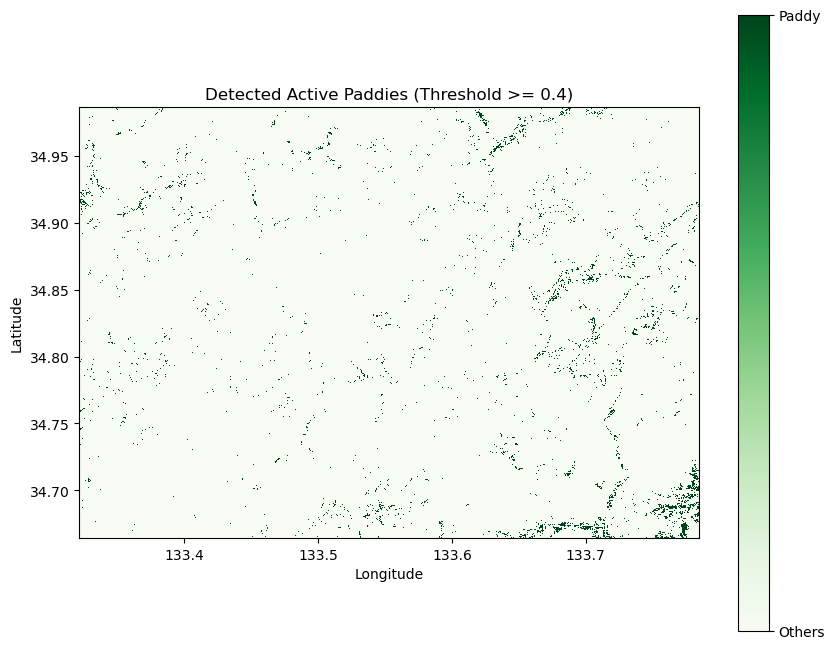

In [158]:
path = "data/satelite_image/takahashi_ndvi_2025_diff.tif"

#取得した差分に対して、差分がより水田と見なすのかどうかの閾値を設定する
#Set a threshold for whether the difference is considered to be more like a paddy field.
threshold_paddy = 0.4

fig, ax = plt.subplots(figsize=(10, 8))

with rio.open(path) as src:
    ndvi = src.read(1)
    
    ndvi = np.where(ndvi == src.nodata, np.nan, ndvi)

    binary_ndvi = np.where(ndvi >= threshold_paddy, 1, 0)
    binary_ndvi = np.where(np.isnan(ndvi), 0, binary_ndvi)

    img = ax.imshow(binary_ndvi, 
                    cmap='Greens', 
                    vmin=0, vmax=1, 
                    extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                    interpolation='nearest')

    ax.set_title(f"Detected Active Paddies (Threshold >= {threshold_paddy})")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    
    cbar = plt.colorbar(img, ax=ax, ticks=[0, 1])
    cbar.ax.set_yticklabels(['Others', 'Paddy']) 

    plt.show()

#### 1.4.5 差分NDVIを用いたリスクマップの実使用面での評価

##### 1.4.5.1 差分NDVIとリスクマップを重ねて表示

In [159]:
ndvi_diff_path = "data/satelite_image/takahashi_ndvi_2025_diff.tif"

with rio.open(ndvi_diff_path) as src:
    ndvi = src.read(1)
    bounds = [[src.bounds.bottom, src.bounds.left], [src.bounds.top, src.bounds.right]]
    ndvi = np.nan_to_num(ndvi, nan=-9999)
    binary_ndvi = (ndvi >= threshold_paddy).astype(int)

mask_height, mask_width = binary_ndvi.shape
mask_map = np.zeros((mask_height, mask_width, 4), dtype=np.uint8)
#Green
mask_map[(binary_ndvi == 1)] = [0, 255, 0, 200]


risk_ndvi_map = folium.Map(location=[34.79, 133.61], zoom_start=13)


folium.TileLayer(
    tiles='https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
    attr='Google',
    name='Google Satellite',
    overlay=False,
    control=True
).add_to(risk_ndvi_map)


folium.TileLayer(
    tiles='OpenStreetMap',
    name='Open Street Map',
    overlay=False,
    control=True
).add_to(risk_ndvi_map)


raster_layers.ImageOverlay(
    image=mask_map,
    bounds=bounds,
    opacity=1.0,
    name="Detected Paddies (White)",
    zindex=20,
    overlay=True
).add_to(risk_ndvi_map)

#リスクの有無を測る閾値として1.3.4で決めた閾値0.41を用いて、二値マップを作成する
tmp = gdf_2021_takahashi_paddy[gdf_2021_takahashi_paddy['future_loss_risk'] > threshold]
#不要な列の削減
gdf_2021_city_paddy_binary = tmp[['geometry','future_loss_risk']]

folium.GeoJson(
    gdf_2021_city_paddy_binary.to_crs(epsg=4326),
    name="Risk Prediction Map",
    style_function=lambda x: {'fillColor': 'blue', 'color': 'blue', 'weight': 1, 'fillOpacity': 0.0},
    zindex=30,
    overlay=True
).add_to(risk_ndvi_map)


# コントロール追加
folium.LayerControl(collapsed=False).add_to(risk_ndvi_map)

risk_ndvi_map
risk_ndvi_map.save("./data/output/risk_ndvi_map.html")

##### 1.4.5.2 リスクマップでリスク有と判断した地点に対して水田が消失したかどうかを評価

**評価方針**
2021年の土地利用データから水田消失リスクマップ作成した。
対して2025年の春夏のNDVI画像から簡易的に推論した水田を示すマップを用いて、水田消失リスク予測マップが実際に衛星データに対してどの程度正答率があるのかを測る。

正答率 = (リスクマップがリスク有と判断してNDVI画像で水田ではないと判断した地点) ÷ (リスクマップがリスク有と判断した地点)  とする。

In [160]:
#Check data frame
gdf_2021_city_paddy_binary


,geometry,future_loss_risk
46582,"POLYGON ((-223266.525 -138474.846, -223152.022...",0.526741
47408,"POLYGON ((-223720.046 -138278.826, -223605.546...",0.739426
47647,"POLYGON ((-221535.656 -137961.558, -221421.161...",0.461478
48843,"POLYGON ((-219681.695 -137080.865, -219567.213...",0.548285
48858,"POLYGON ((-219107.082 -137002.042, -218992.601...",0.579970
...,...,...
293443,"POLYGON ((-212277.465 -114128.372, -212163.273...",0.531016
293444,"POLYGON ((-212163.273 -114131.023, -212049.081...",0.533498
293438,"POLYGON ((-211708.647 -114234.069, -211594.454...",0.455300
293447,"POLYGON ((-211820.697 -114138.967, -211706.506...",0.551538


In [161]:
with rio.open(ndvi_diff_path) as src:
    risk_map = gdf_2021_city_paddy_binary.to_crs(src.crs)
    coords = [(point.centroid.x, point.centroid.y)for point in risk_map.geometry]
    ndvi_sample_value = [(value[0] > threshold_paddy).astype(int) for value in src.sample(coords)]

len(gdf_2021_city_paddy_binary)
print('リスクマップの正解率(vs 差分NDVI) :', ndvi_sample_value.count(0)/len(gdf_2021_city_paddy_binary))

リスクマップの正解率(vs 差分NDVI) : 0.93048128342246


高い数字が出ているが、これはポリゴンの重心座標が差分NDVIで水田であると判断している座標と一致していることが条件で、\
自治体公開のshpファイルと衛星データの精度差であったり実際に可視化した地図を参照すると、この判定方法はリスクマップ側に有利であることが分かる。\
改善案としてリスク有ポリゴンの中に差分NDVIで水田と判断されたピクセルが5ピクセル以上ある場合は水田が現存していると判断することとする。

<figure>
  <img src="./data/Output/img/riskmap_fault_version.jpg" width="50%">
  <figcaption>リスクマップと差分NDVi画像の実態</figcaption>
</figure>

<span style="font-size: 24px; font-weight: bold;">
  改善施策 : ポリゴン内に差分NDVIのピクセルを含む場合は水田は残存しているとする
</span>

先の手法では上図において、水田消失リスクがあるエリアを示すポリゴンの重心座標が、差分NDVIより水田と判断したピクセル座標と重なっていない場合に正解と判断していた。\
上図を見てわかるように、実際にはリスク有のポリゴン内に差分ピクセルが含まれる場合もあり、また、リスクマップは行政の調査データより得られており、差分NDVI画像は衛星画像より得られているため精度が異なる。\
以上の背景より、先の評価手法はリスクマップに対して有利であるため、改善施策としてポリゴン内に一定数のピクセルが含まれている場合は水田が残存していると評価することとする。



In [155]:
i=0
threshold_pix_cnt = 1 #水田残存と判断するためのpolygon内のpixel数

with rio.open(ndvi_diff_path) as src:
    for idx, row in gdf_2021_city_paddy_binary.to_crs(src.crs).iterrows():

        polygon = [row['geometry']]

        out_image, out_transform = rio_mask(src, polygon, crop=True)

        pix_cnt = (out_image[0] >= threshold_paddy).sum()

        if pix_cnt < threshold_pix_cnt:
            i+=1

accuracy = i/len(gdf_2021_city_paddy_binary)

print('Accuracy :',accuracy)

Accuracy : 0.713903743315508


行政データより生成されたリスクマップと衛星データでの精度差を鑑みて、threshold_pix_cntの値を1と最大限に低い値に設定したが、それでもモデルがリスク有と判定した地点のうち71%が実際に水田ではない地点と判定された。\
threshold_pix_cnt=1の時、作成した水田消失リスクマップは71%の精度で差分NDVIで生成した水田マップに対して、どの水田が2021年から2025年で消失したかを正解したと言える。

ただし、
- 行政データ(shapeファイル)より生成されたリスクマップと衛星データでの精度差
- 水田マップは春夏のNDVIの差分で作成したものであり、精度に課題がある
といったことを踏まえると、改善の余地はまだ残されている。

## 2. まとめと今後

### 2.1. まとめ

* **土地利用の変遷**: 1976年当時は広範囲に存在した水田が、2021年にかけて徐々に森林や畑などの別の土地利用に遷移していく様子が可視化された。
* **リスクマップの生成**: 機械学習モデルにより、巨瀬町内の「今後消失するリスクが高い水田」をヒートマップ形式で可視化することに成功した。
* **モデル精度と検証**: 春夏のNDVI画像の差分を利用して作成した水田マップを2025年時点での暫定的な正解とし、リスクマップとの重ね合わせにより、モデルが「消失リスク高」と判定したエリアは71%の一致率で水田消失を予測できていると分かった。

### 2.2 ネイチャーポジティブの社会実装に向けて
本プロジェクトで作成した水田消失マップを今後発展させていくことで、水田の耕作放棄が進んでいる地域において、優先的にどのエリアの水田を保護するのか。もしくは水田維持までは実施せずとも湿地化させて生物多様性を保護するのか。という初期のリスクスクリーニングに活用可能だと考えられる。\
加えて、昨今のインバウンド観光客の興味関心は大都市だけではなく、日本固有の田園風景にも向けられている。\
水田のある里山風景そのものを観光資源とし、観光企業と協業することで水田もしくは湿地帯の保全とそれによって生まれる経済効果で地方でのネイチャーポジティブを推進できる可能性も考えられる。

### 2.3. 今後

Future Workとして下記のような内容が挙げられる。\

- **最新の水田地点の予測精度向上**: 水田消失リスクモデルに対して、単純に春夏のNDVIの差分から作成した水田予測地点を評価指標として用いているが、精度に関してはまだまだ課題がある。\
下記webサイトで紹介されるような様々な衛星画像から得た指標を用いて推測して算出した水田マップを用いるなど改善の余地がある。
    - **参考** : [つくば市の土地利用分類の予測](https://qiita.com/chicken_data_analyst/items/886d35561a4f23653dc4)
    - 以下ブランチで上記ブログの実装を参考に実装中
        - **ブランチ名**
- **水生生物のオカレンスデータを組み合わせた分析**: 水田に生息する生き物のSDM(Species Distributiuon Model)と組み合わせた分析
- **衛星データをさらに用いた高精度の分析**: 衛星画像データをさらに組み合わせた水田損失リスクマップの作成
    - DNNで水田を特定+特定した地点の年代ごとの水田の変化(NDVI推移)で耕作放棄されているか継続しているかの判定 等...